<a href="https://colab.research.google.com/github/AnkurN1/Dog-breed-classification/blob/main/Dog_breed_classification_with_deep_learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

 # Multilclass Dog-breed classification prject

 This notebook will build a multi-class image classifier using TensorFlow 2.0 and Hub

 ## 1)Aim

 To identify the breed of a dog given an image of  a dog.

 ## 2)Data

This data is taken from kaggle god breed identification competition.

## 3)Evaluation 

the evaluation is a file with prediction probabilities for each test images.

## 4)Features
some info about the data:
 * we are dealing with images so its probably best we use deep learing.
 * there are 120 breeds of dogs.
 * there are around 10,000+ images in train and test set.

 

In [ ]:
# !unzip "/content/drive/MyDrive/colab project/dog-breed-identification.zip" -d "drive/MyDrive/colab project"

## Building work space
* importing important libary

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
if tf.config.list_logical_devices:
  print("gpu is connected")
else:
  print("gpu is not connected") 

gpu is connected


## Importing data 
* importing from drive
* converting it to numerical type

In [ ]:
import pandas as pd
import numpy as np
import os
from PIL import Image
from matplotlib.pyplot import imread
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split


In [ ]:
labels_csv=pd.read_csv("/content/drive/MyDrive/colab project/labels.csv")
labels_csv.info()
labels_csv.head(5)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10222 entries, 0 to 10221
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      10222 non-null  object
 1   breed   10222 non-null  object
dtypes: object(2)
memory usage: 159.8+ KB


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


''

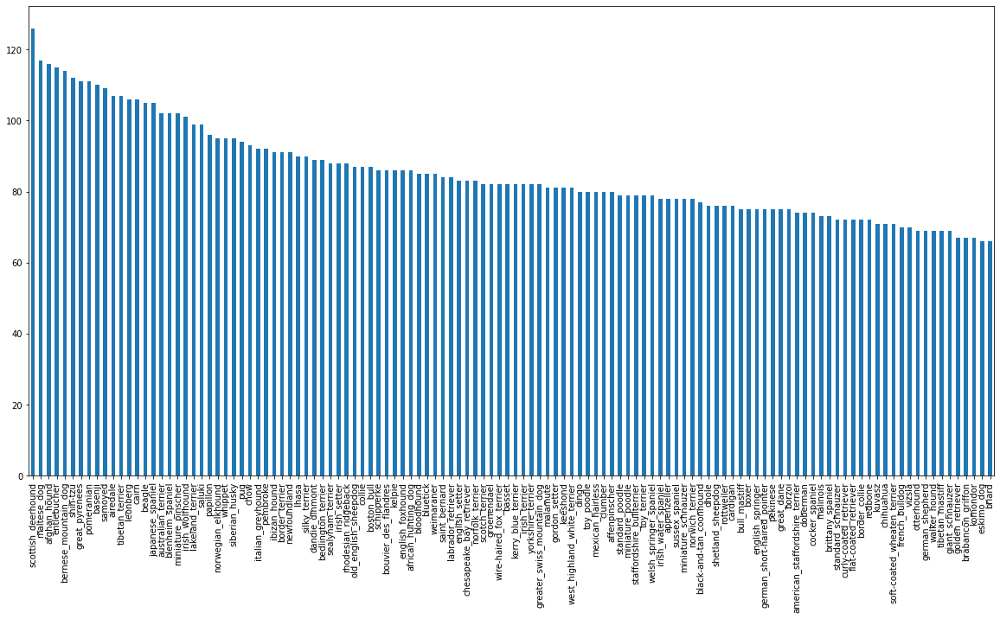

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))
;

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

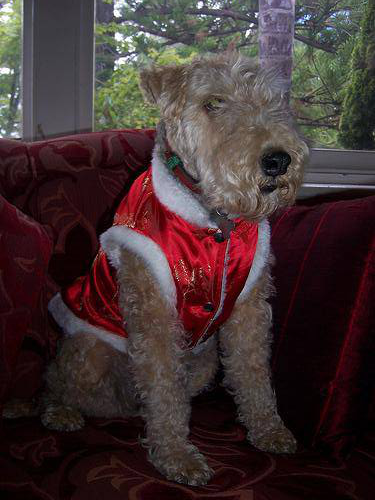

In [ ]:
Img=Image.open("/content/drive/MyDrive/colab project/train/007ff9a78eba2aebb558afea3a51c469.jpg")
Img.rotate(90, expand=True)

In [ ]:
filenames = ["/content/drive/MyDrive/colab project/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames[:10]

['/content/drive/MyDrive/colab project/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/colab project/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/colab project/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/colab project/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/colab project/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/colab project/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/colab project/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/colab project/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/colab project/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/colab project/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os
os.listdir("/content/drive/MyDrive/colab project/train/")[:10]

['dbfff28982e6d9f71c4491d3f9246fac.jpg',
 'e308be2d0ae640f51c08166b2e3ce396.jpg',
 'e82a61cd6a3285ab9bba11fc8d752fa9.jpg',
 'e20e32bf114141e20a1af854ca4d0ecc.jpg',
 'e41d436e4f76b4c13a92abde03ae2721.jpg',
 'dd664bf798e6b767704a9da2e0d26cbe.jpg',
 'e5470144eceb4e454681874ffe3e7e78.jpg',
 'e001b6f5092b2b90501111b23ab30d12.jpg',
 'e59d5676c3b4910024b164265ace3217.jpg',
 'dcfb91097cb730519db11709821e3afb.jpg']

In [ ]:
if len(os.listdir("/content/drive/MyDrive/colab project/train/"))==len(filenames):
  print("Filename matches actual amount of files")
else:
  ("Filenames doesnot match same amount of files")

Filename matches actual amount of files


So we can see the number of files in train folder is same as lebels 

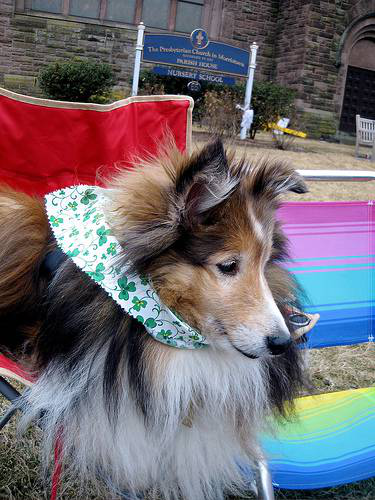

In [ ]:
Image.open(filenames[10])

In [ ]:
labels = labels_csv["breed"]
labels=np.array(labels)
if len(labels)==len(filenames):
  print("procide")
else:
  print("recheack")

procide


In [ ]:
# converting numpy arr to integer
unique_breeds = np.unique(labels)

boolen_labels=[label==unique_breeds for label in labels]
boolen_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# bool to int 
print(labels[5])
print(np.where(unique_breeds==labels[5]))
print(boolen_labels[5].argmax())
print(boolen_labels[5].astype(int))

bedlington_terrier
(array([10]),)
10
[0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
# setting x and y
x=filenames
y=boolen_labels

##  We will start with around 1000 images and move on

In [ ]:
#  creating validation set
NUM_IMAGES = 1000 #@param {type:"slider", min:"1000", max:10000, step:10}
IMG_SIZE = 224

In [ ]:
x_train, x_val, y_train, y_val=train_test_split(x[:NUM_IMAGES],
                                                y[:NUM_IMAGES],
                                                test_size=0.2,
                                               random_state=3)
len(x_train), len(x_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
x_train[:3], y_train[:1]

(['/content/drive/MyDrive/colab project/train/01e4d3d1cb704ed819bce35d22e716a7.jpg',
  '/content/drive/MyDrive/colab project/train/029ed6af5dcadfd105db9271e12ede14.jpg',
  '/content/drive/MyDrive/colab project/train/04b5834c3a969c6308ce157c547bb313.jpg'],
 [array([False, False, False, False, False,  True, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, F

## Preprocessing images (turning them into Tensors)
* reading and saving the image file
* converting image to tensor
* resizing all images as same size 

In [ ]:
 image=imread(filenames[10])
 image.shape

(500, 375, 3)

In [ ]:
# converting image to tensors
tf.constant(image)[:10]

<tf.Tensor: shape=(10, 375, 3), dtype=uint8, numpy=
array([[[110, 100, 108],
        [120, 110, 118],
        [112, 102, 110],
        ...,
        [ 75,  68,  75],
        [ 80,  73,  80],
        [ 74,  67,  74]],

       [[ 99,  89,  97],
        [112, 102, 110],
        [109,  99, 107],
        ...,
        [ 73,  67,  71],
        [ 78,  72,  76],
        [ 73,  67,  71]],

       [[ 82,  72,  80],
        [ 90,  80,  88],
        [ 84,  74,  82],
        ...,
        [ 71,  65,  69],
        [ 74,  68,  72],
        [ 70,  64,  68]],

       ...,

       [[103,  94,  97],
        [118, 109, 112],
        [116, 107, 110],
        ...,
        [ 79,  70,  71],
        [ 76,  67,  68],
        [ 71,  62,  63]],

       [[ 98,  89,  92],
        [106,  97, 100],
        [115, 106, 109],
        ...,
        [ 72,  66,  66],
        [ 71,  65,  65],
        [ 61,  55,  55]],

       [[ 94,  85,  86],
        [ 84,  75,  76],
        [ 82,  73,  74],
        ...,
        [ 71,  67,  68

In [ ]:
def pre_image(image_path, img_size=IMG_SIZE):
  image=tf.io.read_file(image_path) #shdavbo4209834,,,...
  image=tf.image.decode_jpeg(image, channels=3) #[504, 349, 34],[230, 34, 134]
  image=tf.image.convert_image_dtype(image, tf.float32) #00011101001
  image=tf.image.resize(image, size=[img_size, img_size]) #244,244 so we can train and test
  return image

## Turning data in mini batches
* we need them in batch size of 32 in each
* they should be in a tupel of (x, y) like (image, label)

In [ ]:
def img_lab(image_path, label):
  image=pre_image(image_path)
  return image, label

In [ ]:
(pre_image(x[5]), tf.constant(y[5]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.55616987, 0.5287189 , 0.5566773 ],
         [0.5428946 , 0.5154436 , 0.54309523],
         [0.5500795 , 0.52262855, 0.5501857 ],
         ...,
         [0.3613761 , 0.3189093 , 0.4003794 ],
         [0.34154582, 0.3146901 , 0.3379742 ],
         [0.371971  , 0.3484416 , 0.35007018]],
 
        [[0.6206712 , 0.5995309 , 0.6315795 ],
         [0.51885086, 0.49861065, 0.52795875],
         [0.57547784, 0.55551463, 0.5840317 ],
         ...,
         [0.46214655, 0.4386277 , 0.4928084 ],
         [0.5010633 , 0.482064  , 0.5026675 ],
         [0.5154147 , 0.49734616, 0.50860304]],
 
        [[0.6406513 , 0.6171219 , 0.6617122 ],
         [0.5945257 , 0.5709963 , 0.61558664],
         [0.633351  , 0.6098216 , 0.654412  ],
         ...,
         [0.48805717, 0.4733191 , 0.5118025 ],
         [0.50137603, 0.4885207 , 0.51440644],
         [0.49075273, 0.4800047 , 0.5027362 ]],
 
        ...,
 
        [[0.5600854 , 0.51694816

In [ ]:
BATCH_SIZE=32
def data_batch(x, y=None, size=BATCH_SIZE, val_data=False, test_data=False):
  """
  creating batches of data out of x and y pair.
  """
# fro test data set
  if test_data:
    print("creating test data batches")
    data=tf.data.Dataset.from_tensor_slices(tf.constant(x))
    data_batch=data.map(pre_image).batch(BATCH_SIZE)
    return data_batch
# no need to shuffle validation set 
  elif val_data:
    print("creating validation data batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))
    data_batch=data.map(img_lab).batch(BATCH_SIZE)
    return data_batch
# ṣhuffle training set
  else:
    print("creating training data batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))
    data=data.shuffle(buffer_size=len(x))
    data=data.map(img_lab)
    data_batch=data.batch(BATCH_SIZE)
    return data_batch

## Creating training and validation data


In [ ]:
train_data=data_batch(x_train, y_train)
val_data=data_batch(x_val, y_val, val_data=True)

creating training data batches
creating validation data batches


In [ ]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches
* Our data is now in batches however these can be a little hard to understand/comprehend, let's visulize them!

In [ ]:
def show_img(images, labels):
  plt.figure(figsize=(10, 10))
  for i in range(25):
      ax=plt.subplot(5, 5, i+1)
      plt.imshow(images[i])
      plt.title(unique_breeds[labels[i].argmax()])
      plt.axis("off")


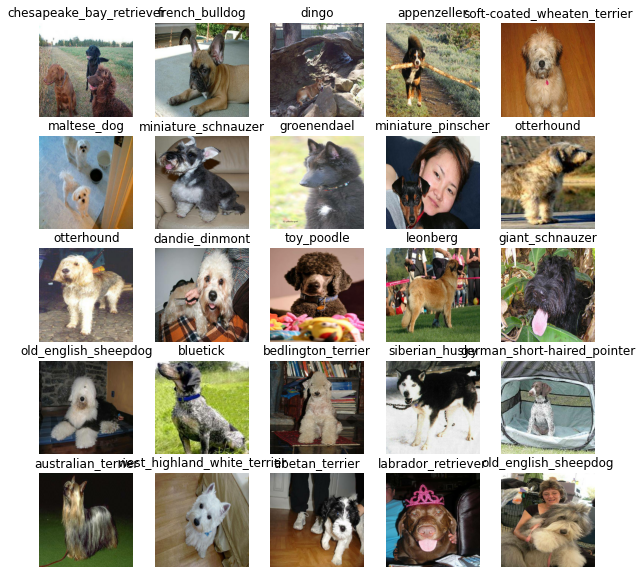

In [ ]:
train_images, train_labels=next(train_data.as_numpy_iterator())
show_img(train_images, train_labels)

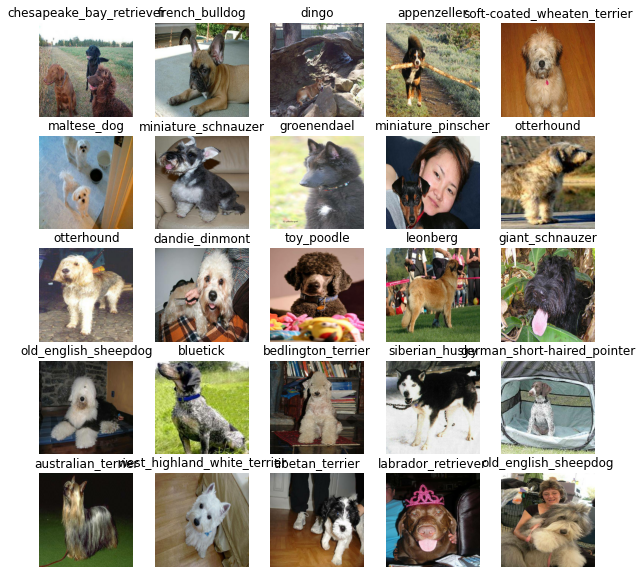

In [ ]:
val_images, val_labels=next(val_data.as_numpy_iterator())
show_img(train_images, train_labels)

# Building a model
* The inpute shape is in tensors.
* The output shape has to be tensors.
* The URL of the model we want to use.


In [ ]:
# inpute shape
INPUT_SHAPE=[None, IMG_SIZE, IMG_SIZE, 3]
# output shape
OUTPUT_SHAPE=len(unique_breeds)
# model URL
MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"
INPUT_SHAPE

[None, 224, 224, 3]

## Now we have got our inputs, outputs and model ready let's put them together into a Keras deep learning model!

* Takes the input shape, output shape and the model we've chosen as parameters.

* Define the layers in a keras model in sequential fashion.

* Build the model.

* Returns the model.



In [ ]:
# building a function for keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print(f"Building a model with: {MODEL_URL}")
  model=tf.keras.Sequential([hub.KerasLayer(MODEL_URL), tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax")])
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
    )
  model.build(INPUT_SHAPE)
  return model


In [ ]:
model=create_model()
model.summary()

Building a model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [ ]:
#  creating callback functions which helps in adjusting model by will
%load_ext tensorboard

import datetime

def tensor_board():
  logdir=os.path.join("/content/drive/MyDrive/colab project/logs",
                       datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)


In [ ]:
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                 patience=3)

### Training a model on subset
* Starting with 1000 images so that everything goes smoothly

In [ ]:
NUM_EPOCHS=100 #@param{type:"slider", min:10, max:100}

### Creating a function which trains a model.
* create a model
* make a callback function
* call fit() on that model to fit the trained model
* return the model



In [ ]:
def train_model():
  """
  Train a given model and returns the trained version.
  """
  model=create_model()
  tensorboard = tensor_board()
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  return model

In [ ]:
model=train_model()

Building a model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 155s 6s/step - loss: 4.5269 - accuracy: 0.0975 - val_loss: 3.1545 - val_accuracy: 0.2700
Epoch 2/100
25/25 [==============================] - 3s 122ms/step - loss: 1.6134 - accuracy: 0.6888 - val_loss: 1.9128 - val_accuracy: 0.5400
Epoch 3/100
25/25 [==============================] - 3s 124ms/step - loss: 0.5639 - accuracy: 0.9375 - val_loss: 1.4792 - val_accuracy: 0.6550
Epoch 4/100
25/25 [==============================] - 3s 122ms/step - loss: 0.2520 - accuracy: 0.9875 - val_loss: 1.3218 - val_accuracy: 0.6550
Epoch 5/100
25/25 [==============================] - 3s 123ms/step - loss: 0.1472 - accuracy: 0.9962 - val_loss: 1.2566 - val_accuracy: 0.6900
Epoch 6/100
25/25 [==============================] - 3s 120ms/step - loss: 0.0997 - accuracy: 1.0000 - val_loss: 1.2197 - val_accuracy: 0.6750
Epoch 7/100
25/25 [=============================

### checking tensorboard logs
The tensorBoard magic fiunction will access the logs and we can have a clean visulizetion on its content

In [ ]:
%tensorboard --logdir drive/MyDrive/colab\ project/logs

<IPython.core.display.Javascript object>

In [ ]:
# making preddictions 
predictions=model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 4s 97ms/step


array([[1.2186258e-05, 2.0263495e-03, 5.7474826e-06, ..., 8.2257995e-04,
        7.0999260e-05, 6.5736829e-05],
       [5.3360192e-03, 5.2359514e-02, 8.1096007e-04, ..., 2.3989371e-04,
        1.0572667e-03, 9.1767265e-04],
       [1.1719106e-05, 7.2144700e-05, 2.5595649e-04, ..., 8.4033068e-03,
        2.4945079e-05, 1.4261824e-04],
       ...,
       [1.5304500e-05, 5.9016654e-03, 6.8156096e-06, ..., 1.4605646e-05,
        8.9210480e-05, 7.8780176e-05],
       [6.4277621e-05, 1.3107958e-04, 2.8618004e-05, ..., 3.8743997e-06,
        2.0762973e-05, 3.1629982e-04],
       [1.7094592e-04, 2.6604152e-04, 2.2130412e-04, ..., 2.3146709e-04,
        2.5307236e-03, 4.9855391e-04]], dtype=float32)

In [ ]:
index = 0
print(predictions[index])
print(f"max value (probility of prediction): {np.max(predictions[index])}")
print(f"sum: {np.sum(predictions[index])}")
print(f"predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.21862577e-05 2.02634954e-03 5.74748265e-06 8.39817221e-05
 2.15109467e-04 1.70032741e-04 1.33883191e-06 1.41886921e-04
 5.28086048e-06 1.89896364e-05 1.61760418e-05 3.64703083e-05
 2.21710470e-05 6.91416835e-06 6.76638680e-04 4.53632747e-05
 3.94340866e-04 4.76335466e-04 7.72082276e-05 4.77300608e-04
 6.15607569e-05 9.95950401e-03 1.62664539e-04 1.21719728e-03
 2.04439657e-05 9.21950758e-01 1.56026272e-05 2.03275602e-04
 2.65168172e-04 6.54738278e-06 1.85226945e-05 1.05444618e-04
 4.32729830e-05 1.53978239e-03 4.13501621e-05 1.00346069e-05
 1.56404967e-05 1.53074492e-04 1.02022756e-03 1.65193196e-04
 2.45095143e-05 3.78617224e-05 4.83198710e-05 3.35344484e-05
 4.58966060e-05 1.63091710e-04 5.46924166e-05 8.34343227e-05
 1.98506517e-04 1.38748495e-04 2.45043466e-05 3.17618460e-03
 7.62217314e-05 5.58558677e-05 9.89415275e-05 1.32258883e-05
 6.22908774e-05 2.44238581e-05 9.72476028e-06 1.70994038e-03
 2.27375596e-04 2.20215170e-05 1.89316561e-04 5.38833032e-04
 4.09088010e-04 4.360763

In [ ]:
def get_pred_label(prediction_prob):
  """
  Turn an arr of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_prob)]

  # predection label based on prediction probility
pred_label = get_pred_label(predictions[81])
pred_label

'weimaraner'

In [ ]:
def unbatchify(data):
  images=[]
  labels=[]

  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels
  
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.7254902 , 0.7490196 , 0.7490196 ],
         [0.7254902 , 0.7490196 , 0.7490196 ],
         [0.7254902 , 0.7490196 , 0.7490196 ],
         ...,
         [0.7424983 , 0.77779245, 0.76602775],
         [0.7499468 , 0.7695547 , 0.78603023],
         [0.7423144 , 0.7619223 , 0.7844367 ]],
 
        [[0.72553396, 0.7490634 , 0.7490634 ],
         [0.72553396, 0.7490634 , 0.7490634 ],
         [0.72553396, 0.7490634 , 0.7490634 ],
         ...,
         [0.7411765 , 0.7803922 , 0.7765512 ],
         [0.7342284 , 0.753241  , 0.7649924 ],
         [0.7306015 , 0.74389875, 0.76040787]],
 
        [[0.7294118 , 0.75294125, 0.75294125],
         [0.7294118 , 0.75294125, 0.75294125],
         [0.7294118 , 0.75294125, 0.75294125],
         ...,
         [0.73848915, 0.7777049 , 0.7838995 ],
         [0.750443  , 0.76636034, 0.77155983],
         [0.74729514, 0.7559512 , 0.76098555]],
 
        ...,
 
        [[0.6937563 , 0.56042296, 0.45454058],
         [0.6607966 , 0.52746326, 0.42942

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  pred_prob, true_label, image=prediction_probabilities[n], labels[n], images[n]
  pred_label=get_pred_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  
  if pred_label==true_label:
    color="green"
  else:
    color="red"

  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label), color=color)

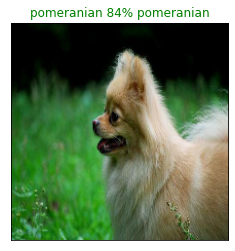

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=34)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  pred_prob, true_label = prediction_probabilities[n], labels[n]
  pred_label=get_pred_label(pred_prob)
  top_10_pred_index=pred_prob.argsort()[-10:][::-1]
  top_10_pred_values=pred_prob[top_10_pred_index]
  top_10_pred_labels=unique_breeds[top_10_pred_index]

  top_plot=plt.bar(np.arange(len(top_10_pred_labels)),
                  top_10_pred_values,
                  color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
            labels=top_10_pred_labels,
            rotation="vertical")
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color("green")
  else:
    pass

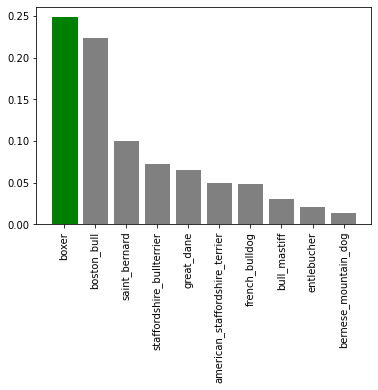

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=169)

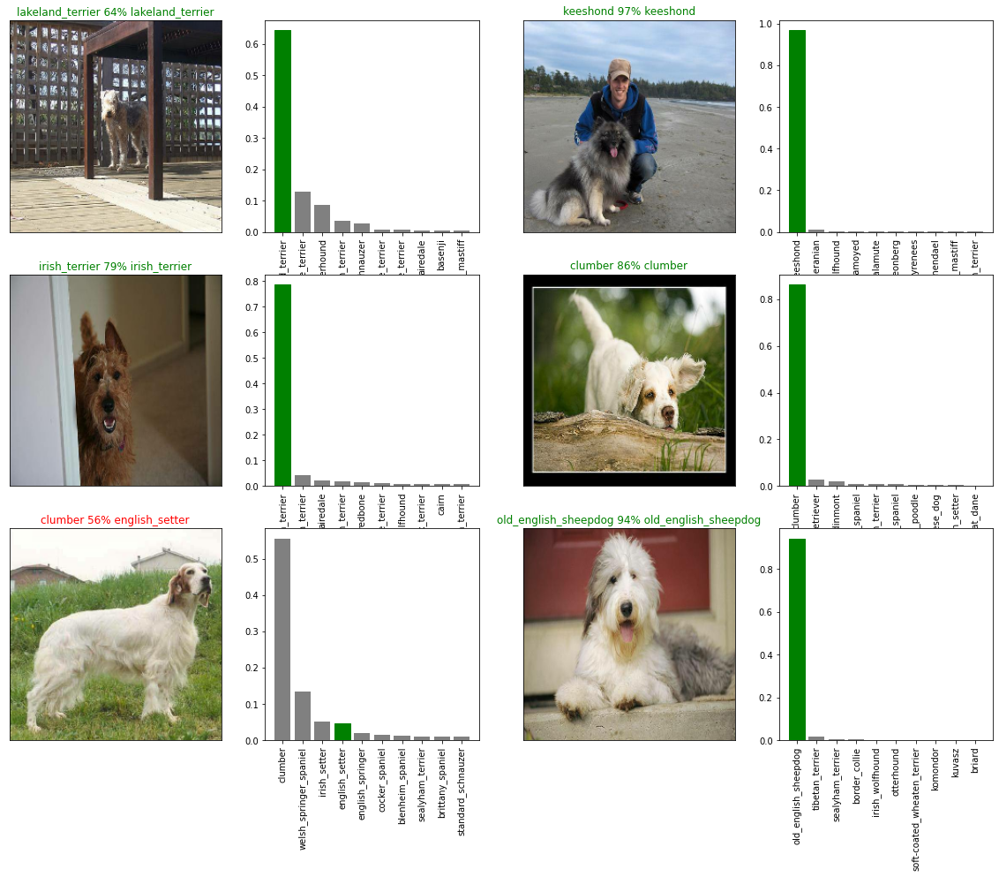

In [ ]:
i_multiplier = 10
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
  

### Saving and reloading trained model

In [ ]:
def save_model(model, suffix=None):
  modeldir=os.path.join("/content/drive/MyDrive/colab project/models",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path=modeldir + "_"+ suffix + ".h5"
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
from tensorflow_hub.keras_layer import KerasLayer
def load_model(model_path):
  print(f"Loading model to: {model_path}...")
  model=tf.keras.models.load_model(model_path, custom_objects={"KerasLayer":hub.KerasLayer})
  return model


In [ ]:
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/colab project/models/20220625-122100_1000-images-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/colab project/models/20220625-122100_1000-images-mobilenetv2-Adam.h5'

In [ ]:
loaded_1000_image_model = load_model("/content/drive/MyDrive/colab project/models/20220625-121625_1000-images-mobilenetv2-Adam.h5")

Loading model to: /content/drive/MyDrive/colab project/models/20220625-121625_1000-images-mobilenetv2-Adam.h5...


In [ ]:
model.evaluate(val_data)

7/7 [==============================] - 1s 106ms/step - loss: 1.1183 - accuracy: 0.6950


[1.1182886362075806, 0.6949999928474426]

In [ ]:
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 113ms/step - loss: 1.1183 - accuracy: 0.6950


[1.1182886362075806, 0.6949999928474426]

### Training on full model

In [ ]:
full_data=data_batch(x, y)
full_data

creating training data batches


<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
full_model=create_model()

Building a model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
full_model_tensorboard=tensor_board()
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                          patience=3)

In [ ]:
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 1275s 4s/step - loss: 1.3157 - accuracy: 0.6744
Epoch 2/100
320/320 [==============================] - 37s 115ms/step - loss: 0.3978 - accuracy: 0.8801
Epoch 3/100
320/320 [==============================] - 51s 159ms/step - loss: 0.2359 - accuracy: 0.9367
Epoch 4/100
320/320 [==============================] - 56s 173ms/step - loss: 0.1528 - accuracy: 0.9625
Epoch 5/100
320/320 [==============================] - 38s 120ms/step - loss: 0.1065 - accuracy: 0.9771
Epoch 6/100
320/320 [==============================] - 40s 125ms/step - loss: 0.0769 - accuracy: 0.9866
Epoch 7/100
320/320 [==============================] - 40s 124ms/step - loss: 0.0579 - accuracy: 0.9913
Epoch 8/100
320/320 [==============================] - 46s 142ms/step - loss: 0.0456 - accuracy: 0.9948
Epoch 9/100
320/320 [==============================] - 66s 205ms/step - loss: 0.0382 - accuracy: 0.9953
Epoch 10/100
320/320 [==============================] - 42s 131ms

In [ ]:
# save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/colab project/models/20220625-133226_full-image-set-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/colab project/models/20220625-133226_full-image-set-mobilenetv2-Adam.h5'

In [ ]:
loaded_full_model = load_model("/content/drive/MyDrive/colab project/models/20220625-133226_full-image-set-mobilenetv2-Adam.h5")

Loading model to: /content/drive/MyDrive/colab project/models/20220625-133226_full-image-set-mobilenetv2-Adam.h5...


In [ ]:
# making predictions 
test_path="/content/drive/MyDrive/colab project/test/"
test_filenames=[test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/colab project/test/e743bea73da2c0dab99ccdbc697b1ac8.jpg',
 '/content/drive/MyDrive/colab project/test/e1cad2c1658b4a81db4750218a1f57d2.jpg',
 '/content/drive/MyDrive/colab project/test/de9a61a532241cff14e732f43b646d9a.jpg',
 '/content/drive/MyDrive/colab project/test/e089aa32bc96c2a9753e7a5fcdc1bac9.jpg',
 '/content/drive/MyDrive/colab project/test/dcd3cfe0cd6d363a3ed21639c434c8d3.jpg',
 '/content/drive/MyDrive/colab project/test/e0072c3d9bee718b68ff1cf964a52536.jpg',
 '/content/drive/MyDrive/colab project/test/e0d51afc60c25eb2205be1644af09cc5.jpg',
 '/content/drive/MyDrive/colab project/test/df8d6d05e6f83c513a4ab0077207a72a.jpg',
 '/content/drive/MyDrive/colab project/test/e380bd4f8375d09ae72f4f36aa610031.jpg',
 '/content/drive/MyDrive/colab project/test/e63a126acd70223f2d388702843d185b.jpg']

In [ ]:
test_data=data_batch(test_filenames, test_data=True)
test_data

creating test data batches


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
test_predictions=loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 1175s 4s/step


In [ ]:
# np.savetxt("/content/drive/MyDrive/colab project/preds_arr.csv", test_predictions, delimiter=",")


In [ ]:
test_predictions=np.loadtxt("/content/drive/MyDrive/colab project/preds_arr.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[9.82453526e-15, 7.43657235e-15, 2.90318047e-11, ...,
        6.95208224e-10, 1.66489073e-07, 2.78543255e-09],
       [3.38739720e-15, 1.46809160e-13, 2.21505547e-09, ...,
        6.60107935e-06, 6.58081444e-06, 5.19251864e-10],
       [9.34997206e-06, 1.28169540e-05, 4.63688909e-09, ...,
        1.01322883e-07, 9.28148097e-07, 4.29419416e-08],
       ...,
       [1.03574309e-10, 1.74096874e-06, 1.56417657e-11, ...,
        9.56388718e-11, 1.20955458e-16, 9.03162853e-13],
       [2.81704549e-09, 9.48795531e-09, 4.18152957e-10, ...,
        5.55165904e-08, 5.29192175e-06, 4.70700563e-08],
       [3.12767309e-13, 1.02284015e-09, 2.44329088e-11, ...,
        7.47602119e-11, 1.14387633e-12, 7.25633659e-12]])

In [ ]:
# submiting in kagal model
preds_df=pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_ids=[os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"]=test_ids

In [ ]:
preds_df[list(unique_breeds)]=test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e743bea73da2c0dab99ccdbc697b1ac8,9.824535e-15,7.436572e-15,2.903180e-11,3.198993e-14,3.551865e-11,1.147890e-08,2.807767e-12,3.003365e-06,2.040969e-14,...,1.020372e-12,4.462082e-09,6.410079e-11,1.723418e-10,3.609485e-11,5.610536e-09,4.826124e-13,6.952082e-10,1.664891e-07,2.785433e-09
1,e1cad2c1658b4a81db4750218a1f57d2,3.387397e-15,1.468092e-13,2.215055e-09,2.893540e-11,2.402140e-07,4.733509e-10,6.131057e-08,9.987339e-01,4.378601e-09,...,3.643088e-10,2.774611e-09,1.609180e-11,1.796039e-09,1.571255e-08,7.712473e-07,1.527168e-09,6.601079e-06,6.580814e-06,5.192519e-10
2,de9a61a532241cff14e732f43b646d9a,9.349972e-06,1.281695e-05,4.636889e-09,3.411872e-07,6.094697e-11,4.949720e-11,6.853999e-06,8.914700e-09,2.676415e-11,...,1.961523e-08,2.584636e-08,5.341735e-08,2.045204e-07,1.973492e-10,1.451939e-08,1.113830e-09,1.013229e-07,9.281481e-07,4.294194e-08
3,e089aa32bc96c2a9753e7a5fcdc1bac9,1.468662e-11,4.173860e-10,4.975684e-11,1.142937e-10,5.614363e-12,1.378364e-09,1.010295e-12,2.116763e-14,3.414419e-13,...,1.742597e-14,1.782268e-11,5.817957e-13,1.986066e-10,4.479009e-10,7.845656e-14,4.826528e-11,2.316077e-06,1.016579e-08,4.340162e-13
4,dcd3cfe0cd6d363a3ed21639c434c8d3,5.810897e-10,3.982211e-15,2.951016e-10,8.081943e-13,1.132663e-12,3.708157e-07,1.516780e-07,4.043754e-05,2.931421e-13,...,8.655529e-12,4.017075e-07,6.201346e-13,2.751796e-08,7.443504e-13,9.423763e-10,2.633988e-08,8.629133e-13,3.753219e-08,1.472248e-11


In [ ]:
preds_df.to_csv("/content/drive/MyDrive/colab project/full_model_predictions_mobilenetv2_1.csv",
                index=False)

### Custom images

In [ ]:
custom_path="/content/drive/MyDrive/colab project/my dogs/"
custom_image_paths=[custom_path + fname for fname in os.listdir(custom_path)]
custom_image_paths

['/content/drive/MyDrive/colab project/my dogs/download (3).jpg',
 '/content/drive/MyDrive/colab project/my dogs/download (2).jpg',
 '/content/drive/MyDrive/colab project/my dogs/download (5).jpg']

In [ ]:
custom_data=data_batch(custom_image_paths, test_data=True)
custom_data

creating test data batches


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
custom_preds=loaded_full_model.predict(custom_data)
custom_preds.shape 

(3, 120)

In [ ]:
custom_pred_labels=[get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['english_setter', 'german_shepherd', 'labrador_retriever', 'siberian_husky']

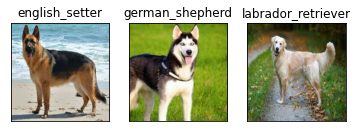

In [ ]:
custom_images=[]
for image in  custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)